# Wannierization

Electronic simulation codes like Quantum Espresso calculate the Bloch bands $\varepsilon_{\mathbf kn}$ and wavefunctions $\psi_{n\mathbf k}(\mathbf r)$ of a crystal lattice. These bands are gauge invariant while the wavefunctions allow for an ambiguity in the choice of complex phase. These gauges need to be consistent if we wish to transform these wavefunctions to a localized Wannier function {cite}`wannier_review`:

$$
|\mathbf Rn\rangle=\frac{V}{(2\pi)^2}\int_{BZ}\text d\mathbf k\, \text e^{-i\mathbf k\cdot\mathbf R}|\psi_{n\mathbf k}\rangle.
$$(eq:wannier_transform)

## Projection method

One way to remove the gauge inconsistency is to project trial orbitals $|g_n\rangle$ on the basis of the Bloch wavefunctions:

$$
|\phi_{n\mathbf k}\rangle=\underbrace{\sum_m|\psi_{m\mathbf k}\rangle\langle\psi_{m\mathbf k}}_{P_\mathbf k}|g_{n}\rangle.
$$(eq:nonorthogonal)

The projector $P_\mathbf k$ is gauge invariant so the $|\phi_{n\mathbf k}\rangle$ are as well. The $|\phi_{n\mathbf k}\rangle$ are however not necessarily orthogonal. In general we have:

$$
\mathbf S_{mn,\mathbf k} = \langle\phi_{m\mathbf k}|\phi_{n\mathbf k}\rangle\neq\delta_{mn}
$$(eq:Smnk)

Marzari et al. {cite}`wannier_review` propose to orthogonalize the states using a Löwdin transform which finds a set of orthonormal basis functions $|\tilde\psi_{n\mathbf k}\rangle$ that minimizes:

$$
\sum_n \int\text d \mathbf x\,\left |\phi_{n\mathbf k}(\mathbf x)-\tilde\psi_{n\mathbf k}(\mathbf x)\right|^2,
$$(eq:iafbaeifbfaew)

which corresponds to taking:

$$
|\tilde\psi_{n\mathbf k}\rangle=\sum_m|\phi_{m\mathbf k}\rangle \left(\mathbf S_\mathbf k^{-1/2}\right)_{mn}.
$$(eq:tildepsi)

### Example: 1 band

We illustrate the projection method using an example of a 1d isolated band with mock Bloch wavefunction $\psi_\mathbf k(\mathbf r)=u_\mathbf k(\mathbf r)\text e^{i\mathbf k\cdot\mathbf r}$. This functions must obey the periodicity requirements:

* $u_{\mathbf k+\mathbf G}(\mathbf r)=u_{\mathbf k}(\mathbf r)$, with $\mathbf G$ a reciprocal lattice vector.
* $u_\mathbf k(\mathbf r+\mathbf T)=u_\mathbf k(\mathbf r)$, with $\mathbf T$ a lattice vector.

We take lattice spacing $a=1$ in 1d with mock Bloch wavefunction:

$$
u_{k}(x)=\cos(\pi x) (\cos(6\pi x)-2\cos(k)).
$$(eq:trialu)

We plot $\psi_{k}(x)$:

In [1]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from myst_nb import glue
from scipy import integrate
import matplotlib.pyplot as plt

In [2]:
# Create figure
fig = go.Figure()
fig.update_layout(yaxis=dict(range=[-2.5, 2.5]))
M = 200
k_N = 100
x_0 = 1.5
k_mesh = np.linspace(0, 2*np.pi, k_N)

def u(x, k):
    return np.cos(np.pi*x) *(np.cos(np.pi*6*x)-2*np.cos(k))

norms = np.sqrt([integrate.quad(lambda x: np.abs(u(x, k))**2, -0.5, 0.5)[0] for k in k_mesh])

def bloch(x, j):
    k = 2*np.pi*j/k_N
    return u(x, k) * np.exp(1j*x*k) / norms[int(j%k_N)]

# Add traces, one for each slider step
for step in np.arange(0, 2*k_N):
    my_y = bloch(np.linspace(-x_0, x_0, M), step)
    fig.add_trace(
        go.Scatter(
            visible=False,
            name="abs",
            x=np.linspace(-x_0, x_0, M),
            y=np.abs(my_y),
            line = dict(color='red')))
    fig.add_trace(
        go.Scatter(
            visible=False,
            name="real",
            x=np.linspace(-x_0, x_0, M),
            line = dict(color='blue'),
            y=np.real(my_y)))
    fig.add_trace(
        go.Scatter(
            visible=False,
            name="imag",
            line = dict(color='green'),
            x=np.linspace(-x_0, x_0, M),
            y=np.imag(my_y)))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(2*k_N):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}],  # layout attribute
        label=str(5 * i)
    )
    for j in range(3):
        step["args"][0]["visible"][3*i+j] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "k: "},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

We note that the real part of $\psi_k(x)$ is symmetric while the imaginary part is antisymmetric. Any symmetric $g$ will then be purely real. For this function we choose a Gaussian:

$$
g(x)=\text e^{-x^2}.
$$(wvtwggvbvzsd)

Any normalization of $g$ and $\psi$ will cancel in the construction of the orthonormal $\tilde\psi$. We now do the inverse transform of the Bloch wavefunctions of `ref`{eq:wannier_transform} do get the following localized Wannier function:

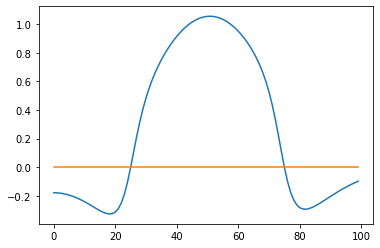

In [3]:
def g(x):
    return np.exp(-x**2)

L = 3
norm = np.sqrt(integrate.quad(lambda x: g(x)**2, -L, L)[0])

def f(x):
    return g(x) / norm

N = k_N
f_k = np.zeros(N, dtype=complex)


for j in range(N):
    f_k[j] = integrate.quad(lambda x: f(x)*np.real(bloch(x, j)), -L, L)[0]
    f_k[j] += 1j*integrate.quad(lambda x: f(x)*np.imag(bloch(x, j)), -L, L)[0]
plt.plot(np.real(f_k))
plt.plot(np.imag(f_k))
plt.show()

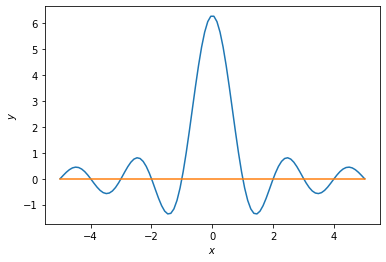

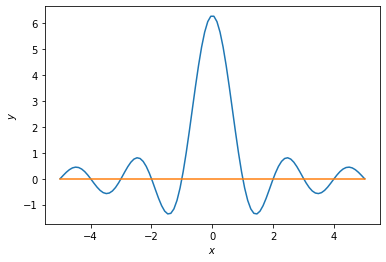

In [4]:
import matplotlib.pyplot as plt

x = np.linspace(-5, 5, 100)  
y = np.zeros(100, dtype=complex)
for i in range(100):
    y[i] = integrate.quad(lambda k: np.cos(k*x[i]), -np.pi, np.pi)[0] + 1j*integrate.quad(lambda k: np.sin(k*x[i]), -np.pi, np.pi)[0]

fig, ax = plt.subplots()    
ax.plot(x, np.real(y))
ax.plot(x, np.imag(y))
ax.set_xlabel(r"$x$")
ax.set_ylabel(r"$y$")
glue("fig:sinc", fig, display=False)

In [5]:
x_0 = 3
M = 200
y = sum([(f_k[step]/ np.abs(f_k[step])* np.conj(bloch(np.linspace(-x_0, x_0, M), step))) for step in range(N)])
my_y = np.divide(y, np.sqrt(2*x_0/M*sum(np.abs(y)**2)))
fig = go.Figure()
fig.add_trace(
        go.Scatter(
            name="real",
            x=np.linspace(-x_0, x_0, M),
            line = dict(color='blue'),
            y=np.real(my_y)))
fig.add_trace(
        go.Scatter(
            name="imag",
            line = dict(color='green'),
            x=np.linspace(-x_0, x_0, M),
            y=np.imag(my_y)))
fig.show()

We see that the Wannier function is localized around $x=0$ with local maxima (minima) appearing around $x\in \mathbb Z$ which become smaller for larger $x$. We explain this behavior by taking some $u(x)$ independent of $k$. Now the Wannier function for a single band is quite simple:
````{margin}
```{glue:figure} fig:sinc
The sinc function which forces the Wannier orbital do decay with a power law for a single band with $u$ independant of $k$.
```
````

$$
|\mathbf Rn\rangle=\frac{V}{(2\pi)^2}u(\mathbf r)\int_{BZ}\text d\mathbf k\, \text e^{i\mathbf k\cdot(\mathbf r-\mathbf R)}\propto u(\mathbf r)\text{sinc}(\pi(\mathbf r-\mathbf R)),
$$(bhibasbc)

which means that any wannierization of a single band boils down to removing the complex phase and using a sinc function as a weight to restrict the $u$ to a unit cell as best as possible. This also means any decay of a Wannier orbital with $u$ independent of $k$ follows a power law.

### Example: 2d atomic orbitals as Bloch wavefunction

To make matters a bit more interesting we'll look at the hibridization of the s, p_$x$ and p$_y$ orbitals in a triangular lattice. As $u$ component of the Bloch waves we take the three sp$^2$ orbitals which we label with $\gamma_i$ and as $g_n$ we take the normal orbitals. Since we need to adhere to periodicity of $u$ we take:

$$
u_i(\mathbf r)=\sum_\mathbf R \gamma_i(\mathbf r+\mathbf R),
$$(bbdaaibwd)

with $\{\mathbf R\}=\left\{\left(0, 0\right), \left(\pm 1,0\right), \left(\pm 1/2,\pm\sqrt{3}/2\right), \left(0, \pm \sqrt3\right), \left(\pm 3/2, \pm\sqrt3/2\right)\right\}$, integration beyond NNN is exponentially surpressed.

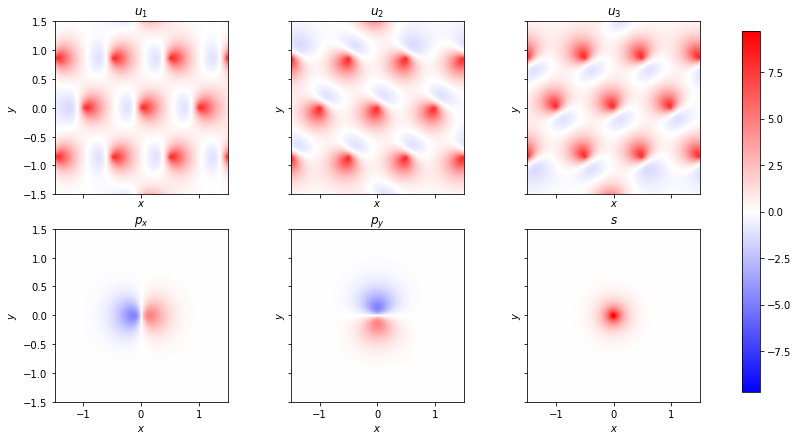

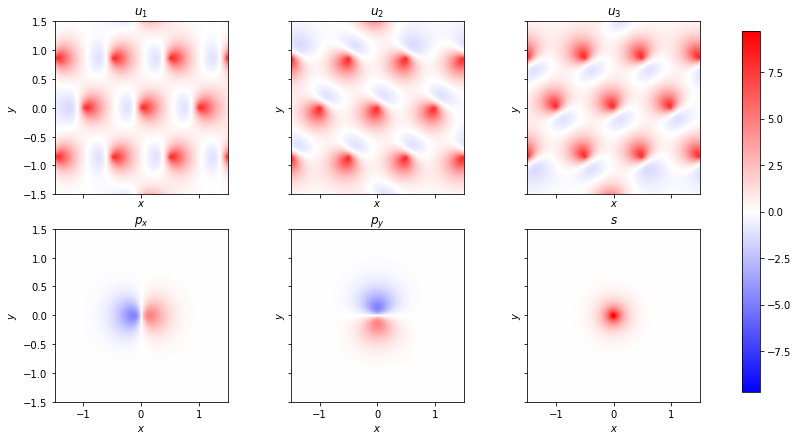

In [6]:
def p_rot(x, y, θ):
    R = np.array([[np.cos(θ),  np.sin(θ)],
                      [-np.sin(θ), np.cos(θ)]])
    return p(*np.tensordot(R, np.array([x, y]), axes=(1, 0)))
    
def p(x, y):
    return x*np.exp(-np.sqrt(x**2+y**2)*7)

def s(x, y):
    return np.exp(-np.sqrt(x**2+y**2)*7)

L = 1.5
N = 100
mesh_tile = (L/N)**2
x, y = np.meshgrid(np.linspace(-L, L, N), np.linspace(-L, L, N))

p_x = p(x, y)
p_y = p(y, x)
s_ = s(x, y)

p_norm = np.sqrt(np.sum(p_x**2)*mesh_tile)
s_norm = np.sqrt(np.sum(s_**2)*mesh_tile)
p_x = p_x / p_norm
p_y = p_y / p_norm
s_ = s_ / s_norm

def γ_1(x, y):
    return (s(x, y)/s_norm + p(x, y)/p_norm) / np.sqrt(2)


def γ_2(x, y):
    return (s(x, y)/s_norm + p_rot(x, y, np.pi*2/3)/p_norm) / np.sqrt(2)


def γ_3(x, y):
    return (s(x, y)/s_norm + p_rot(x, y, -np.pi*2/3)/p_norm) / np.sqrt(2)

def u(x, y, γ):
    my_sum = γ(x, y)
    for σ in [-1, 1]:
        for r in [(σ, 0), (σ/2, np.sqrt(3)/2), (σ/2, -np.sqrt(3)/2), (0, σ*np.sqrt(3)), (σ*3/2, np.sqrt(3)/2), (σ*3/2, -np.sqrt(3)/2)]:
            my_sum += γ(x-r[0], y-r[1])
    return my_sum
    
u_1 = u(x, y, γ_1)
u_2 = u(x, y, γ_2)
u_3 = u(x, y, γ_3)

my_max = np.max(s_)
my_range = dict(vmin=-my_max, vmax=my_max, cmap="bwr", extent=[-L,L,-L,L])


fig, axes = plt.subplots(2, 3, sharey=True, sharex=True, figsize=(15,7))
f =[[u_1, u_2, u_3], [p_x, p_y, s_]]
f_name = [[r"$u_1$", r"$u_2$", r"$u_3$"], [r"$p_x$", r"$p_y$", r"$s$"]]
for i in range(2):
    for j in range(3):
        im = axes[i, j].imshow(f[i][j], **my_range)
        axes[i, j].title.set_text(f_name[i][j])
        axes[i, j].set_xlabel(r"$x$")
        axes[i, j].set_ylabel(r"$y$")
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
glue("fig:basis_functions", fig, display=False)

```{glue:figure} fig:basis_functions
Three periodic $u_i(\mathbf r)$ in a triangular lattice based on sp$^2$ orbitals. We aim to construct localized Wannier orbitals using the three standard atomic orbitals: s, p$_x$ and p$_y$ 
```

Since calculation of integrals in 2d is much more computationally exhausting we move to a mesh representation of the functions. Any integration is just the sum of the mesh times the mesh tile size. We write `ref`{eq:nonorthogonal} out in matrix form:

$$
\begin{pmatrix}
    |\phi_{1\mathbf k}\rangle\\
    |\phi_{2\mathbf k}\rangle\\
    |\phi_{3\mathbf k}\rangle\\
\end{pmatrix}=\underbrace{
\begin{pmatrix}
    \langle u_1|\text e^{-i\mathbf k\cdot\mathbf r}|g_{1}\rangle  & \langle u_2|\text e^{-i\mathbf k\cdot\mathbf r}|g_{1}\rangle &\langle u_3|\text e^{-i\mathbf k\cdot\mathbf r}|g_{1}\rangle\\
        \langle u_1|\text e^{-i\mathbf k\cdot\mathbf r}|g_{2}\rangle  & \langle u_2|\text e^{-i\mathbf k\cdot\mathbf r}|g_{2}\rangle &\langle u_3|\text e^{-i\mathbf k\cdot\mathbf r}|g_{2}\rangle\\
        \langle u_1|\text e^{-i\mathbf k\cdot\mathbf r}|g_{3}\rangle  & \langle u_2|\text e^{-i\mathbf k\cdot\mathbf r}|g_{3}\rangle &\langle u_3|\text e^{-i\mathbf k\cdot\mathbf r}|g_{3}\rangle\\
\end{pmatrix}}_{A_\mathbf k}
\begin{pmatrix}
    e^{i\mathbf k\cdot\mathbf r}| u_{1}\rangle\\
    e^{i\mathbf k\cdot\mathbf r}| u_{2}\rangle\\
    e^{i\mathbf k\cdot\mathbf r}| u_{3}\rangle\\
\end{pmatrix},
$$

then $S_\mathbf k=A_\mathbf k^\dagger A_\mathbf k$, which we diagonalize: $S_\mathbf k=U_\mathbf k^\dagger S^d_\mathbf k U_\mathbf k$. Now we get: $S_\mathbf k^{-1/2}=U_\mathbf k \left(S^d_\mathbf k\right)^{-1/2} U_\mathbf k^\dagger$ and $S_\mathbf k^{-1/2}A_\mathbf k$ is the rotation matrix for the Bloch functions. We remind that any normalization of $g_i$ cancels in this product.

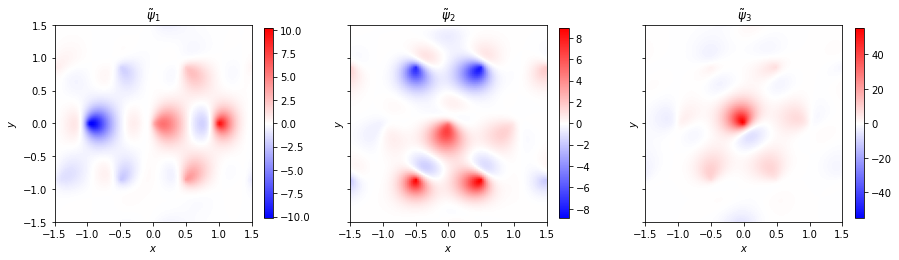

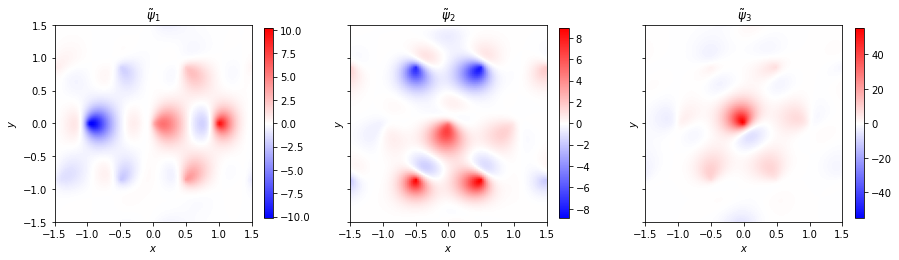

In [7]:
def in_hex(k_x, k_y):
    return (8*np.pi**2 - 2*np.pi*np.abs(k_y) - 4*np.pi*np.abs(k_x)) >= 0

k_x, k_y = np.meshgrid(np.linspace(-np.pi, np.pi, N), np.linspace(-np.pi, np.pi, N))


u_list = [u_1, u_2, u_3] 
g_list = [p_x, p_y, s_]
overlap_mat = np.zeros((3, 3, N, N))

for i in range(3):
    for j in range(3):
        overlap_mat[i, j, :, :] = u_list[i] * g_list[j] 
        
A_k = np.zeros((N, N, 3, 3), dtype=complex)

for i in range(N):
    for j in range(N):
        e_mat = np.exp(-1j*(k_x[i, j]*x+k_y[i, j]*y))
        A_k[i, j, :, :] = np.sum(overlap_mat * e_mat, axis=(2, 3)) * mesh_tile
        
transform = np.zeros((3, 3, N, N), dtype=complex)

for i in range(N):
    for j in range(N):
        if in_hex(k_y[i, j], k_x[i, j]):
            overlap = A_k[i, j, :, :]
            S = np.conj(overlap.T) @ overlap
            eig_val, eig_vec = np.linalg.eigh(S)
            transform[:, :, i, j] = eig_vec.T @ np.diag(1/np.sqrt(eig_val)) @ np.conj(eig_vec) @ overlap

weight = np.zeros((N, N, 3, 3), dtype=complex)

for i in range(N):
    for j in range(N):
        e_mat = np.exp(1j*(k_x*x[i, j]+k_y*y[i, j]))
        weight[i, j, :, :] = np.sum(transform * e_mat, axis=(2, 3)) * mesh_tile
        
ϕ_list = np.sum(np.moveaxis(weight, (0, 1), (2, 3)) * u_list, axis=0)
max_list = [np.max(np.abs(ϕ_list[i, :, :])) for i in range(3)]
my_range = [dict(vmin=-my_max, vmax=my_max, cmap="bwr", extent=[-L,L,-L,L]) for my_max in max_list]


fig, axes = plt.subplots(1, 3, sharey=True, sharex=True, figsize=(15,7))
f_name = [r"$\tilde\psi_1$", r"$\tilde\psi_2$", r"$\tilde\psi_3$"]
for i in range(3):
    im = axes[i].imshow(np.real(ϕ_list[i, :, :]), **(my_range[i]))
    axes[i].title.set_text(f_name[i])
    axes[i].set_xlabel(r"$x$")
    axes[i].set_ylabel(r"$y$")
    plt.colorbar(im, ax=axes[i], shrink=0.5)
glue("fig:output_functions", fig, display=False)

```{glue:figure} fig:output_functions
    :name: "three-band-wannier"
   The three Wannierfunctions which resemble the $g_i$: $\tilde\psi_1$ takes after $p_x$, $\tilde\psi_2$ after $p_y$ and $\tilde\psi_3$ after $s$.
```

The three Wannier wavefunctions in {ref}`three-band-wannier` resemble the atomic orbitals chosen for the $g_i$. The $p$ orbitals delocalize to neighboring sites.